## Explore the data and write down what you have found
## You can use: df.describe(), df["column"], etc.
## Use at least 5 data cleaning techniques inside a file named clean.ipynb
## null values, columns drop, duplicated data, string manipulation, apply fn, categorize, regex, etc.
## Show data that validates the conclusions based on your hypoteses in a file named analysis.ipynb

In [1]:
import pandas as pd
import numpy as np
import zipfile
import pylab as plt  
import seaborn as sns

In [2]:
with zipfile.ZipFile(('/Users/davidledo/Desktop/Proyecto1/attacks.csv.zip'), "r") as zip:
      zip.extract("attacks.csv")

data_ori = pd.read_csv('attacks.csv', encoding = 'latin1')
data = data_ori.copy()
pd.set_option('display.max_columns', None)


In [3]:
data.shape #tamaño de la tabla

(25723, 24)

In [4]:
data.head(200)

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,57,"No injury to occupant, outrigger canoe and pad...",N,18h00,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,NaN,NaN
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,11,Minor injury to left thigh,N,14h00 -15h00,NaN,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,NaN,NaN
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,48,Injury to left lower leg from surfboard skeg,N,07h45,NaN,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,NaN,NaN
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,NaN,Minor injury to lower leg,N,NaN,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,NaN,NaN
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,NaN,Lacerations to leg & hand shark PROVOKED INCIDENT,N,NaN,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,2016.12.11.a,11-Dec-2016,2016.0,Invalid,USA,Florida,"New Smyrna Beach, Volusia County",Surfing,Shane Garthwait,M,19,Cuts to right ankle & foot,NaN,Afternoon,Shark involvement not confirmed,"News Journal, 12/15/2016",2016.12.11.a-Garthwait.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.12.11.a,2016.12.11.a,6108.0,NaN,NaN
196,2016.12.06,06-Dec-2016,2016.0,Provoked,AUSTRALIA,New South Wales,Merimbula,Surf fishing,Jesse Phillips,M,20,Lacerations to both hands while attempting to ...,N,02h00,"Wobbegong shark, 2m",Bay 93.9 Geelong,2016.12.06-Phillips.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.12.06,2016.12.06,6107.0,NaN,NaN
197,2016.12.01,01-Dec-2016,2016.0,Unprovoked,AUSTRALIA,New South Wales,Booti Booti National Park,Surfing,Colin Rowland,M,65,Injuries to foot & arm,N,09h00,White shark,"B. Myatt, GSAF",2016.12.01-Rowland.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.12.01,2016.12.01,6106.0,NaN,NaN
198,2016.11.28,28-Nov-2016,2016.0,Provoked,AUSTRALIA,Victoria,Queenscliff,Fishing,Rod McFarlane,M,73,Laceration to right hand by hooked & gaffed sh...,N,11h00,"Broadnose sevengill shark, 1.5 m","ABC News, 11/28/2016",2016.11.28-Fisherman.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.11.28,2016.11.28,6105.0,NaN,NaN


In [5]:
data.columns #muéstrame los nombres de las columnas

Index(['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area', 'Location',
       'Activity', 'Name', 'Sex ', 'Age', 'Injury', 'Fatal (Y/N)', 'Time',
       'Species ', 'Investigator or Source', 'pdf', 'href formula', 'href',
       'Case Number.1', 'Case Number.2', 'original order', 'Unnamed: 22',
       'Unnamed: 23'],
      dtype='object')

In [6]:
data.info(memory_usage='deep') #uso de memoria y tipo

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25723 entries, 0 to 25722
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Case Number             8702 non-null   object 
 1   Date                    6302 non-null   object 
 2   Year                    6300 non-null   float64
 3   Type                    6298 non-null   object 
 4   Country                 6252 non-null   object 
 5   Area                    5847 non-null   object 
 6   Location                5762 non-null   object 
 7   Activity                5758 non-null   object 
 8   Name                    6092 non-null   object 
 9   Sex                     5737 non-null   object 
 10  Age                     3471 non-null   object 
 11  Injury                  6274 non-null   object 
 12  Fatal (Y/N)             5763 non-null   object 
 13  Time                    2948 non-null   object 
 14  Species                 3464 non-null 

In [7]:
data.describe().T #descripción estadística de las columnas numéricas

,count,mean,std,min,25%,50%,75%,max
Year,6300.0,1927.272381,281.116308,0.0,1942.0,1977.0,2005.0,2018.0
original order,6309.0,3155.999683,1821.396206,2.0,1579.0,3156.0,4733.0,6310.0


In [8]:
data.describe(include='object').T #descripción estadística de las columnas que no sean solo numéricas

,count,unique,top,freq
Case Number,8702,6287,0,2400
Date,6302,5433,1957,11
Type,6298,8,Unprovoked,4595
Country,6252,212,USA,2229
Area,5847,825,Florida,1037
Location,5762,4108,"New Smyrna Beach, Volusia County",163
Activity,5758,1532,Surfing,971
Name,6092,5230,male,550
Sex,5737,6,M,5094
Age,3471,157,17,154


In [9]:
nulos_al_inicio = data.isnull().sum().sum() 

In [10]:
nulos_columna = data.isna().sum() #NaN por columna
nulos_columna[nulos_columna>0]

Case Number               17021
Date                      19421
Year                      19423
Type                      19425
Country                   19471
Area                      19876
Location                  19961
Activity                  19965
Name                      19631
Sex                       19986
Age                       22252
Injury                    19449
Fatal (Y/N)               19960
Time                      22775
Species                   22259
Investigator or Source    19438
pdf                       19421
href formula              19422
href                      19421
Case Number.1             19421
Case Number.2             19421
original order            19414
Unnamed: 22               25722
Unnamed: 23               25721
dtype: int64

In [11]:
data['Unnamed: 22'].value_counts() #suma de los valores de la columna 'Unnamed: 22'

stopped here    1
Name: Unnamed: 22, dtype: int64

In [12]:
data['Unnamed: 23'].value_counts() #suma de los valores de la columna Unnamed: 23

Teramo             1
change filename    1
Name: Unnamed: 23, dtype: int64

In [13]:
data['Unnamed: 23'].notnull().idxmax()#donde están los no nulos de la columna Unnamed: 23?

4415

In [14]:
data.loc[4415, 'Unnamed: 23']#que valor tiene el elemento situado en el indice 4415 de la columna?

'Teramo'

In [15]:
data['Unnamed: 22'].notnull().idxmax()#donde están los no nulos de la columna Unnamed: 23?

1478

In [16]:
data.loc[1478, 'Unnamed: 22']#que valor tiene el elemento situado en el indice 4415 de la columna?

'stopped here'

In [17]:
data.iloc[[1478]]#examino la tabla a la altura de la fila 1478, no observo nada extraño

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
1478,2006.05.27,27-May-2006,2006.0,Unprovoked,USA,Hawaii,"North Shore, O'ahu",Surfing,Bret Desmond,M,31,"No injury, shark bumped surfboard",N,16h00,NaN,R. Collier,2006.05.27-Desmond.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2006.05.27,2006.05.27,4825.0,stopped here,NaN


In [18]:
data = data.drop('Unnamed: 22', axis=1) #elimino la columna pues tiene todos los valores nulos excepto 1

In [19]:
data = data.drop('Unnamed: 23', axis=1) #elimino también la columna 23 pues tiene todos los valores nulos excepto 2

In [20]:
data.isnull().sum()

Case Number               17021
Date                      19421
Year                      19423
Type                      19425
Country                   19471
Area                      19876
Location                  19961
Activity                  19965
Name                      19631
Sex                       19986
Age                       22252
Injury                    19449
Fatal (Y/N)               19960
Time                      22775
Species                   22259
Investigator or Source    19438
pdf                       19421
href formula              19422
href                      19421
Case Number.1             19421
Case Number.2             19421
original order            19414
dtype: int64

In [21]:
data[['href formula', 'href']]#estas dos columnas tienen un número de nulos muy parecidos, sospecho que contienen lo mismo


,href formula,href
0,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...
1,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...
2,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...
3,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...
4,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...
...,...,...
25718,NaN,NaN
25719,NaN,NaN
25720,NaN,NaN
25721,NaN,NaN


In [86]:
data.iloc[6302:25723].head()

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href,Case Number.1,Case Number.2,original order,Risk


In [24]:
data['href'].index[data['href'].isnull()].tolist() #averiguo qué filas de la columna href contienen nulos

[6302,
 6303,
 6304,
 6305,
 6306,
 6307,
 6308,
 6309,
 6310,
 6311,
 6312,
 6313,
 6314,
 6315,
 6316,
 6317,
 6318,
 6319,
 6320,
 6321,
 6322,
 6323,
 6324,
 6325,
 6326,
 6327,
 6328,
 6329,
 6330,
 6331,
 6332,
 6333,
 6334,
 6335,
 6336,
 6337,
 6338,
 6339,
 6340,
 6341,
 6342,
 6343,
 6344,
 6345,
 6346,
 6347,
 6348,
 6349,
 6350,
 6351,
 6352,
 6353,
 6354,
 6355,
 6356,
 6357,
 6358,
 6359,
 6360,
 6361,
 6362,
 6363,
 6364,
 6365,
 6366,
 6367,
 6368,
 6369,
 6370,
 6371,
 6372,
 6373,
 6374,
 6375,
 6376,
 6377,
 6378,
 6379,
 6380,
 6381,
 6382,
 6383,
 6384,
 6385,
 6386,
 6387,
 6388,
 6389,
 6390,
 6391,
 6392,
 6393,
 6394,
 6395,
 6396,
 6397,
 6398,
 6399,
 6400,
 6401,
 6402,
 6403,
 6404,
 6405,
 6406,
 6407,
 6408,
 6409,
 6410,
 6411,
 6412,
 6413,
 6414,
 6415,
 6416,
 6417,
 6418,
 6419,
 6420,
 6421,
 6422,
 6423,
 6424,
 6425,
 6426,
 6427,
 6428,
 6429,
 6430,
 6431,
 6432,
 6433,
 6434,
 6435,
 6436,
 6437,
 6438,
 6439,
 6440,
 6441,
 6442,
 6443,
 6444,

In [25]:
data = data.drop('href formula', axis=1)#elimino la columna 'href formula' por redundante

In [26]:
pd.set_option('display.max_rows', None) #soy un poco animal y compruebo visualmente las filas del DF que coinciden con los nulos de la columna href, ha valido la pena lleva a jupyter notebook al límite porque compruebo que TODOS los valores comprendido entre esas filas son nulos
#data[data['href'].isnull()]

In [27]:
len(data.isnull()[6302:25723])==len(data.iloc()[6302:25722])#pregunto si la cantidad de elementos que hay entre las filas es igual al numero de elementos nulos que hay entre las filas y sí, lo que sospechaba

False

In [28]:
data.drop(data.index[6302:25723], inplace=True)#elimino esas filas

In [29]:
def contar_nulos():
    nulos = data.isnull()
    num_nulos = nulos.sum(axis=0)
    return num_nulos

In [30]:
contar_nulos()

Case Number                  1
Date                         0
Year                         2
Type                         4
Country                     50
Area                       455
Location                   540
Activity                   544
Name                       210
Sex                        565
Age                       2831
Injury                      28
Fatal (Y/N)                539
Time                      3354
Species                   2838
Investigator or Source      17
pdf                          0
href                         0
Case Number.1                0
Case Number.2                0
original order               0
dtype: int64

In [31]:
data.shape

(6302, 21)

In [32]:
print(nulos_al_inicio)
data.isnull().sum().sum() 

488276


11978

In [33]:
data[data['Time'].isnull()]#le pido que me muestre la tabla a la altura de las filas donde Time es NaN

             Case Number                                               Date  \
3             2018.06.08                                        08-Jun-2018   
4             2018.06.04                                        04-Jun-2018   
5           2018.06.03.b                                        03-Jun-2018   
7             2018.05.27                                        27-May-2018   
11            2018.05.21                                        21-May-2018   
14            2018.05.00                                           May 2018   
17          2018.04.30.R                               Reported 30-Apr-2018   
25            2018.04.19                                        19-Apr-2018   
26          2018.04.15.d                                        15-Apr-2018   
27          2018.04.15.c                                        15-Apr-2018   
28          2018.04.15.b                                        15-Apr-2018   
31          2018.04.10.R                            

In [34]:
data.isnull().all(axis=1).any()#con esto le pregunto si hay alguna fila en la que todos sus  valores sean nulos

False

In [35]:
data['Time'].fillna(0, inplace=True)#sustituyo los nulos de la columna Time por 0

In [36]:
data['Time'].isnull().sum()#compruebo que la columna Time no contenga ningún 0

0

In [37]:
print(nulos_al_inicio)
print(data.isnull().sum().sum())
contar_nulos()

488276
8624


Case Number                  1
Date                         0
Year                         2
Type                         4
Country                     50
Area                       455
Location                   540
Activity                   544
Name                       210
Sex                        565
Age                       2831
Injury                      28
Fatal (Y/N)                539
Time                         0
Species                   2838
Investigator or Source      17
pdf                          0
href                         0
Case Number.1                0
Case Number.2                0
original order               0
dtype: int64

In [38]:
data= data.rename(columns={'Species ': 'Species'})#corrijo el nombre de la columna Species

In [39]:
data[data['Species'].isnull()]#miro la tabla un rato buscando alguna pista que me diga con qué puedo rellenar los datos faltantes pero solo consigo aunmentar mi astigmatismo

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href,Case Number.1,Case Number.2,original order
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,11,Minor injury to left thigh,N,14h00 -15h00,NaN,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,48,Injury to left lower leg from surfboard skeg,N,07h45,NaN,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0
5,2018.06.03.b,03-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,"Flat Rock, Ballina",Kite surfing,Chris,M,NaN,"No injury, board bitten",N,0,NaN,"Daily Telegraph, 6/4/2018",2018.06.03.b-FlatRock.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.03.b,2018.06.03.b,6298.0
9,2018.05.26.a,26-May-2018,2018.0,Unprovoked,USA,Florida,"Daytona Beach, Volusia County",Standing,male,M,12,Minor injury to foot,N,14h00,NaN,"K. McMurray, Tracking Sharks.com",2018.05.26.a-DaytonaBeach.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.05.26.a,2018.05.26.a,6294.0
11,2018.05.21,21-May-2018,2018.0,Unprovoked,USA,South Carolina,"Isle of Palms, Charleston County",Boogie boarding,Trey de Boer,M,10,Injuries to lower right leg and foot,N,0,NaN,"C. Creswell, GSAF",2018.05.21-deBoer.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.05.21,2018.05.21,6292.0
12,2018.05.13.b,13-May-2018,2018.0,Unprovoked,USA,South Carolina,"Hilton Head Island, Beaufort County",Swimming,Jei Turrell,M,10,Severe bite to right forearm,N,15h00,NaN,"C. Creswell, GSAF & K. McMurray TrackingSharks...",2018.05.13.b-Turrell.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.05.13.b,2018.05.13.b,6291.0
15,2018.05.12,12-May-2018,2018.0,Unprovoked,SOUTH AFRICA,Eastern Cape Province,"Nahoon Beach, East London",Surfing,male,M,NaN,"Minor injury, marks on board",N,11h00,NaN,"B.Jacob, Dispatch Live, 5/12/2018",2018.05.12-EastLondon.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.05.12,2018.05.12,6288.0
17,2018.04.30.R,Reported 30-Apr-2018,2018.0,Unprovoked,THAILAND,Hua Hin,Sai Noi Beach,Swimming,female,M,NaN,Minor injury to ankle,N,0,NaN,"K. McMurray, TrackingSharks.com",2018.04.30.R-Thailand.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.04.30.R,2018.04.30.R,6286.0
19,2018.04.28.a,28-Apr-2018,2018.0,Unprovoked,AUSTRALIA,Western Australia,Gearys Beach,Surfing,Adam Murray,M,NaN,"No injury, knocked off board by shark",N,16h50,NaN,"B. Myatt, GSAF",2018.04.28.a-Murray.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.04.28.a,2018.04.28.a,6284.0
27,2018.04.15.c,15-Apr-2018,2018.0,Unprovoked,BRAZIL,Pernambuco,Piedade,Swimming,Pablo de Melo,M,34,"Multiple severe injuries to arms and leg, leg ...",NaN,0,NaN,"Globo, 4/16/2018",2018.04.15.c-deMelo.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.04.15.c,2018.04.15.c,6276.0


In [40]:
data['Species'].fillna('Unknown', inplace=True) #los sustituyo por Unknown y pido cita con el oculista, creo que tengo una incipiente presbicia

In [41]:
data['Age'].fillna(0, inplace=True)#hago lo mismo con la columna Age pero en lugar de Unknown utilizo 0 ya que es una columna de valores numéricos

In [42]:
data= data.rename(columns={'Sex ': 'Sex'})

In [43]:
data.loc[data['Name'] == 'male', 'Sex'] = 'M' #observo que en la columna Name aparece en algunas ocasiones el sexo, así que siempre que esto suceda cambio el valor que aparece en Sex por el mismo que hay en Name
data.loc[data['Name'] == 'female', 'Sex'] = 'F'

In [44]:
data['Sex'].fillna('Unknown', inplace=True)#el resto de nulos los sustituyo por unknown

In [45]:
data['Activity'].fillna('Unknown', inplace=True) #sustituyo por Unknown los nulos de la columna Activity

In [46]:
data['Location'].fillna('Unknown', inplace=True) #sustituyo por Unknown los nulos de la columna Location

In [47]:
data= data.rename(columns={'Fatal (Y/N) ': 'Fatal (Y/N)'}) #corrijo el nombre de la columna Fatal (Y/N)

In [48]:
#data.loc[data['Injury'] == 'FATAL', 'Fatal (Y/N)'] = 'Y' #para la columna 'Fatal (Y/N)' sustituyo los valores por 'Y', en caso que en la columna 'Injury' aparezca el valor 'Fatal'
data['Fatal (Y/N)'] = np.where(data['Injury'].str.contains('FATAL', na=False), 'Y', data['Fatal (Y/N)'])

In [49]:
data['Fatal (Y/N)'].fillna('Unknown', inplace=True) #por si acaso queda algún NaN

In [50]:
%pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [51]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="my_app")

In [52]:
#me iba a flipar averiguando, a partir de la localización, el país y el estado/provincia para rellenarlos allí donde son NaN, pero no tengo tiempo
'''latitudes = []
longitudes = []

for location in data['Location']:
    try:
        geocode = geolocator.geocode(location)
        latitudes.append(geocode.latitude)
        longitudes.append(geocode.longitude)
    except:
        latitudes.append(None)
        longitudes.append(None)
print(latitudes)
print(longitudes)'''

"latitudes = []\nlongitudes = []\n\nfor location in data['Location']:\n    try:\n        geocode = geolocator.geocode(location)\n        latitudes.append(geocode.latitude)\n        longitudes.append(geocode.longitude)\n    except:\n        latitudes.append(None)\n        longitudes.append(None)\nprint(latitudes)\nprint(longitudes)"

In [53]:
print(nulos_al_inicio)
print(data.isnull().sum().sum())
contar_nulos()

488276
767


Case Number                 1
Date                        0
Year                        2
Type                        4
Country                    50
Area                      455
Location                    0
Activity                    0
Name                      210
Sex                         0
Age                         0
Injury                     28
Fatal (Y/N)                 0
Time                        0
Species                     0
Investigator or Source     17
pdf                         0
href                        0
Case Number.1               0
Case Number.2               0
original order              0
dtype: int64

In [54]:
data['Area'].fillna('Unknown', inplace=True) #sustituyo por Unknown los nulos de la columna Area

In [55]:
data['Name'].fillna('Unknown', inplace=True) #sustituyo por Unknown los nulos de la columna Name

In [56]:
data['Country'].fillna('Unknown', inplace=True) #sustituyo por Unknown los nulos de la columna Country

In [57]:
data['Injury'] = data['Injury'].fillna('FATAL').where(data['Fatal (Y/N)'] != 'Y', 'FATAL')#Sustituyo los valores nulos de la columna Injury por el valor FATAL, siempre y cuando en la columna Fatal (Y/N) haya un valor Y

In [58]:
data['Investigator or Source'].fillna('Unknown', inplace=True) #sustituyo por Unknown los nulos de la columna Investigator or Source

In [59]:
data['Type'].fillna('Unknown', inplace=True) #sustituyo por Unknown los nulos de la columna Type

In [60]:
data[data['Year'].isnull()] #en qué filas están los nulos de la columna Year

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href,Case Number.1,Case Number.2,original order
187,2017.01.08.R,Reported 08-Jan-2017,NaN,Invalid,AUSTRALIA,Queensland,Unknown,Spearfishing,Kerry Daniel,M,35,"No attack, shark made a threat display",Unknown,0,Bull shark,Liquid Vision 1/8/2017,2017.01.08.R-KerryDaniel.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2017.01.08.R,2017.01.08.R,6116.0
6079,1836.08.19.R,Reported 19-Aug-1836,NaN,Unprovoked,ENGLAND,Cumberland,Whitehaven,Swimming,a boy,M,0,FATAL,Y,0,Unknown,"C. Moore, GSAF",1835.08.19.R-Whitehaven.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,1836.08.19.R,1836.08.19.R,224.0


In [61]:
data.loc[187, 'Year'] = 2017 #sustituyo los nulos de la columna Year por el año que indica el valor de la columna Date
data.loc[6079, 'Year'] = 1836
data['Year'].fillna('Unknown', inplace=True) #sustituyo por Unknown los nulos de la columna Year

In [62]:
(data['Case Number'] == data['Case Number.1']) & (data['Case Number.1'] == data['Case Number.2']) #Compruebo si los valores dentro de las columnas dentro de 'Case Number', 'Case Number.1' y 'Case Number.2' están repetidos 



0        True
1        True
2        True
3        True
4        True
5        True
6        True
7        True
8        True
9        True
10       True
11       True
12       True
13       True
14       True
15       True
16       True
17       True
18       True
19       True
20       True
21       True
22       True
23       True
24       True
25       True
26       True
27       True
28       True
29       True
30       True
31       True
32       True
33       True
34      False
35       True
36       True
37       True
38       True
39       True
40       True
41       True
42       True
43       True
44       True
45       True
46       True
47       True
48       True
49       True
50       True
51       True
52       True
53       True
54       True
55       True
56       True
57       True
58       True
59       True
60       True
61       True
62       True
63       True
64       True
65       True
66       True
67       True
68       True
69       True
70       True
71    

In [63]:
data[~((data['Case Number'] == data['Case Number.1']) & (data['Case Number.1'] == data['Case Number.2']))]#ojeo las filas donde los elementos no están repetidos

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href,Case Number.1,Case Number.2,original order
34,2018.04.03,03-Apr-2018,2018.0,Unprovoked,SOUTH AFRICA,Eastern Cape Province,St. Francis Bay,Surfing,Ross Spowart,M,19,Lacerations to left knee & lower leg,N,15h00,White shark,"K. McMurray, TrackingSharks.com",2018.04.03-StFrancisBay.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.04.02,2018.04.03,6269.0
117,2017.07.20.a,20-Jul-2017,2017.0,Unprovoked,USA,California,"Seal Rock, Goleta Beach, Santa Barbara",SUP,Rolf Geyling,M,50,"No injury, shark bit paddleboard",N,07h45,"White shark, 8' to 10'","R. Collier, GSAF",2017.07.20.a-Geyling.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2017/07.20.a,2017.07.20.a,6186.0
144,2017.05.06,05-May-2017,2017.0,Unprovoked,MEXICO,Baja California Sur,"Los Arbolitos, Cabo Pulmo",Snorkeling,Andres Rozada,M,33,FATAL,Y,17h00,Unknown,J. Rozada,2017.05.06-Rozada.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2017.06.06,2017.05.06,6159.0
217,2016.09.15,16-Sep-2016,2016.0,Unprovoked,AUSTRALIA,Victoria,Bells Beach,Surfing,male,M,0,No injury: Knocked off board by shark,N,0,2 m shark,"The Age, 9/16/2016",2016.09.16-BellsBeach.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.16,2016.09.15,6086.0
314,2016.01.24.b,24-Jan-2016,2016.0,Unprovoked,USA,Texas,Off Surfside,Spearfishing,Keith Love,M,0,"Bruised ribs & tail bone, speargun broken and ...",N,09h30 / 10h00,Bull sharks x 2,K. Love,2016.01.24.b-Love.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.01.24.b,2016.01.24.b,5989.0
334,2015.12.23,07-Nov-2015,2015.0,Invalid,USA,Florida,"Paradise Beach, Melbourne, Brevard County",Surfing,Ryla Underwood,F,9,Lower left leg injured,Unknown,11h00,Shark involvement not confirmed,"Fox25Orlando, 11/7/2015",2015.11.07-Underwood.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.11.07,2015.12.23,5969.0
339,2015.10.28.a,28-Oct-2015,2015.0,Unprovoked,USA,Hawaii,"Malaka, Oahu",Body boarding,Raymond Senensi,M,10,"Lacerations & puncture wounds to right thigh, ...",N,14h50,Unknown,"Star Advertiser, 10/28/2015",2015.10.28-Senensi.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.10.28,2015.10.28.a,5964.0
390,2015.07-10,10-Jul-2015,2015.0,Unprovoked,USA,California,"Huntington Beach, Orange County",Surfing,Danny Miskin,M,38,"No injury, shark bumped & damaged board",N,08h45,"White shark, 7'","KTLA, 7/10/2015",2015.07.10-Miskin.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.07.10,2015.07.10,5913.0
560,2014.05.04,04-May-2014,2014.0,Unprovoked,SOUTH AFRICA,Western Cape Province,Simonstown,Diving,Unknown,Unknown,0,4-inch laceration to arm,N,0,Cow shark,"Sunday Times, 5/5/2014",2015.05.04-CowShark.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2013.05.04,2014.05.04,5743.0
3522,1967.07.05,05-Jul-1967,1967.0,Unprovoked,TURKEY,Mugla Province,Kucukada Island,Spearfishing,Gungor Guven,M,36,FATAL,Y,13h40,Unknown,"C. Moore, GSAF",1967.07.05-Guven.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,1967/07.05,1967.07.05,2781.0


In [64]:
#De momento normalizo las referencias cambiando las comas por puntos en las tres columnas
data['Case Number'] = data['Case Number'].str.replace(',', '.').str.replace('-', '.').str.replace('/', '.')
data['Case Number.1'] = data['Case Number.1'].str.replace(',', '.').str.replace('-', '.').str.replace('/', '.')
data['Case Number.2'] = data['Case Number.2'].str.replace(',', '.').str.replace('-', '.').str.replace('/', '.')

In [65]:
data.loc[5488, 'Case Number'] = "1905.09.06" #Corrijo el nulo de la columna 'Case Number' basándome en el valor de la columna 'Date'
#No voy a eliminar las columnas Case Number, Case Number.1 y Case Number.2 puesto que son números para clasificar los casos de uso interno y del cual desconozco si las diferencias se deben a errores o no

In [66]:
data.shape

(6302, 21)

In [67]:
contar_nulos()

Case Number               0
Date                      0
Year                      0
Type                      0
Country                   0
Area                      0
Location                  0
Activity                  0
Name                      0
Sex                       0
Age                       0
Injury                    0
Fatal (Y/N)               0
Time                      0
Species                   0
Investigator or Source    0
pdf                       0
href                      0
Case Number.1             0
Case Number.2             0
original order            0
dtype: int64

In [68]:
data = data.replace('unknown', 'Unknown') #sustituyo todos los valores unknown por Unknown

In [69]:
#le pido que me muestre las filas donde hay mas de 3 valores unknown
data[data.eq('Unknown').sum(axis=1) > 3]

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href,Case Number.1,Case Number.2,original order
62,2017.11.13.R,Reported 13-Nov-2017,2017.0,Unprovoked,Unknown,Unknown,Unknown,Surfing,Timur Yunusov,M,24,Puncture wounds to feet,N,0,Unknown,Instagram,2017.11.13.R-Timur.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2017.11.13.R,2017.11.13.R,6241.0
154,2017.04.17.b,17-Apr-2017,2017.0,Unprovoked,USA,Florida,"Daytona Beach, Volusia County",Unknown,Unknown,Unknown,0,Minor bite to the foot,N,Afternoon,Unknown,"Daytona Beach News-Journal, 4/17/2017",2017.04.17.b-Volusia.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2017.04.17.b,2017.04.17.b,6149.0
226,2016.09.00,Sep-2016,2016.0,Invalid,MEXICO,Unknown,Guadalupe Island,Cage Diving,Unknown,Unknown,0,"No injury to divers, white shark breached cage",Unknown,0,Invalid,K. Yonker,2016.09.00-Breach.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2016.09.00,2016.09.00,6077.0
382,2015.07.27,27-Jul-2015,2015.0,Unknown,AUSTRALIA,Victoria,Tyrendarra Beach,Surfing,male,M,40,Injury to hand,Unknown,0,Unknown,Unknown,2015.07.27-Victoria.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2015.07.27,2015.07.27,5921.0
525,2014.08.00,Aug-2014,2014.0,Invalid,Unknown,Unknown,Unknown,Sea disaster,Cuban refugees,M,0,Shark involvement prior to death not confirmed,Unknown,0,Shark involvement not confirmed,"Associated Press, 11/27/2014",2014.08.00-Cuban-refugees.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2014.08.00,2014.08.00,5778.0
629,2013.09.01.b,01-Sep-2013,2013.0,Unprovoked,BAHAMAS,Unknown,Unknown,Unknown,boy,M,0,Leg injured,N,0,Unknown,"WFTV, 9/2/2013",2013.09.01.b-Bahamas.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2013.09.01.b,2013.09.01.b,5674.0
685,2013.04.13.a,13-Apr-2013,2013.0,Unprovoked,GUAM,Unknown,Unknown,Unknown,Nae Deok Kim,M,40,FATAL,Y,0,Unknown,"Pacific News Center, 4/15/2013",2013.04.13.a-NaeDeokKim.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2013.04.13.a,2013.04.13.a,5618.0
771,2012.06.28.R,Reported 28-Jun-2012,2012.0,Invalid,CROATIA,Unknown,Buccari Bay,Swimming,Unknown,Unknown,60,Leg struck. Initally reported as a shark attac...,Unknown,0,No shark involvement,"Il Gazzettino, 6/28/2012",2012.06.28.R-Croatia.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2012.06.28.R,2012.06.28.R,5532.0
1088,2009.09.18,18-Sep-2009,2009.0,Unprovoked,VIETNAM,Unknown,Unknown,Unknown,Nguyen Quang Vinh,M,0,Lower right leg bitten,N,0,Unknown,"H. Trong & U. Phuong,.Saigon D...",2009.09.18-Vinh.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2009.09.18,2009.09.18,5215.0
1366,2007.07.00,Jul-2007,2007.0,Invalid,SENEGAL,Unknown,Unknown,Murder,Alex Takyi,Unknown,0,FATAL,Unknown,0,Questionable Incident,"Daily Guide, 8/20/2007",2007.07.00-Takyi.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2007.07.00,2007.07.00,4937.0


In [70]:
(data.eq('Unknown').sum(axis=1) > 3).sum()#le pregunto cuantas filas hay con mas de tres valores Unknown

159

In [71]:
data = data.drop(index=data[data.eq('Unknown').sum(axis=1) > 3].index)#elimino las filas donde hay mas de tres valores Unknown

In [72]:
data['Date'] = data['Date'].str.replace('Reported', '') #elimino la palabra reported de las fechas, con esto me doy por satisfecho porque convertirlas a datetime es imposible

In [73]:
data['Date'] = data['Date'].str.lstrip() #elimino los espacios al principio de palabra en la columna Date

In [74]:
data['Fatal (1/0)'] = data['Fatal (Y/N)'].replace({'Y': 1, 'N': 0})#creo una columna que tenga los valores de la columna Fatal (Y/N) en la cual Y=1 y N=0
data['Fatal (1/0)'] = pd.to_numeric(data['Fatal (1/0)'], errors='coerce')
data.head()


,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href,Case Number.1,Case Number.2,original order,Fatal (1/0)
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,57,"No injury to occupant, outrigger canoe and pad...",N,18h00,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,0.0
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,11,Minor injury to left thigh,N,14h00 -15h00,Unknown,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,0.0
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,48,Injury to left lower leg from surfboard skeg,N,07h45,Unknown,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,0.0
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,0,Minor injury to lower leg,N,0,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,0.0
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,0,Lacerations to leg & hand shark PROVOKED INCIDENT,N,0,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,0.0


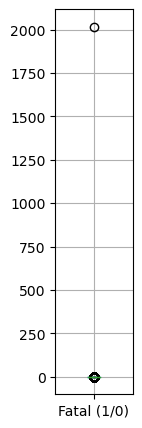

In [75]:
%matplotlib inline
data[['Fatal (1/0)']].boxplot(figsize=(1, 5));#Hago un diagrama de caja y bigotes y no observo nada raro

In [76]:
data = data.drop('Fatal (1/0)', axis=1) #borro la columna

In [78]:
data['Time'] = data['Time'].replace(r'^(?!.*\d{2}h\d{2}$).*$', 0, regex=True) #en la columna Time cambio por 0 todo los valores que no tengan el formato xxhxx 
data['Time'] = data['Time'].replace('h', ':', regex=True) #sustituyo por dos puntos las h

In [80]:
fatal_y = data[data['Fatal (Y/N)'] == 'Y'] 
activity_counts = fatal_y['Activity'].value_counts() #cuento las veces que cada elemento de la columna Activity coincide con una Y en la columna fatal

In [81]:
data['Risk'] = data['Activity'].map(activity_counts) #creo una columna Risk en la que figuran la veces que la actividad realizada ha tenido un desenlace fatal
data['Risk'].fillna(0, inplace=True)

In [83]:
data.head()

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,Injury,Fatal (Y/N),Time,Species,Investigator or Source,pdf,href,Case Number.1,Case Number.2,original order,Risk
0,2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,57,"No injury to occupant, outrigger canoe and pad...",N,18:00,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,0.0
1,2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,11,Minor injury to left thigh,N,14:00 -15:00,Unknown,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,16.0
2,2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,48,Injury to left lower leg from surfboard skeg,N,07:45,Unknown,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,49.0
3,2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,0,Minor injury to lower leg,N,0,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,49.0
4,2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,0,Lacerations to leg & hand shark PROVOKED INCIDENT,N,0,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,5.0
